# Neural & Behavioral Modeling - Week 8 (Exercises)
by 林子堯 (r08227112@ntu.edu.tw)

In [136]:
%config IPCompleter.greedy=True 
%matplotlib inline
from numpy import *
from matplotlib.pyplot import *
from IPython.display import *

## 1 Simulate attentional effects on neurons (10 points)

Please read the following article:

Reynolds, J. H., & Desimone, R. (1999). <a href=https://www.salk.edu/wp-content/uploads/2015/11/rd.pdf>The role of neural mechanisms of attention in solving the binding problem.</a> Neuron, 24(1), 19-29.

and use its model equations in Fig. 10 to reproduce its Fig. 3a:<br><br>
<img src=https://www.researchgate.net/profile/Richard_Wezel/publication/224015518/figure/fig2/AS:213837023322122@1427994127491/When-presented-with-two-visual-stimuli-simultaneously-attention-can-lead-to-changes-in.png>

Note that the stimulus was presented from 0 to 200ms in the Fig. 3a.

<img src=https://marlin-prod.literatumonline.com/cms/attachment/009cc936-2be0-40e5-9d27-f9902ac4494f/gr10.jpg width="250"/>

我遵照 Reynolds & Desimone (1999) 中 Fig 10 所設立的 shunting equation，來模擬在一或二個刺激下 (出現在前 200 ms)，神經 y 的反應。

其中參數如 $A$, $B$, $w_1^+$, $w_2^+$, $w_1^-$, $w_2^-$，我就自己盡力設定成能形成 Fig 3a. 的樣貌，但顯然還是有一些些差別。

值得注意的是，我在 weighted 參數的部分，有一限制為：$w_1^+ + w_2^+ = 1$。當值有一個刺激時，該刺激會獨享所有權重，而兩個刺激同時出現時則會均分。以及注意力的效果會使得 $w_1$ 值提升 1.5 倍 (如同老師在課堂上說明注意力會用乘法增強神經反應的對比)，進而連帶影響其他 weighted 的參數。

In [137]:
def competition(s = [True, True], att_on_vertical = False):
    x = [0.1,0.0075] # two potulation intensities
    y = [40] # output neuron inital intensity (base rate)
    dt = 0.01 # delta t for Euler integration
    t = arange(0, 350, dt)
    A, B = 0.015, 200

    w1_p = s[0] / sum(s) * (1 + 0.5 * att_on_vertical)
    w2_p = 1 - w1_p;
    w1_m = w1_p * 0.05
    w2_m = w2_p * 0.25
          
    for i in t:
        if i > 200:
            s = [False, False]
        
        x[0] = x[0] * s[0]
        x[1] = x[1] * s[1] 
        
        E = x[0] * w1_p + x[1] * w2_p
        I = x[0] * w1_m + x[1] * w2_m
        y0 = y[-1]
        y1 = y0 + dt * ((B - y0) * E - y0 * I - A * y0) 
        y.append(y1)

    return(y)

我模擬 Fig 3a. 中的四種情境，結果如下圖所示：

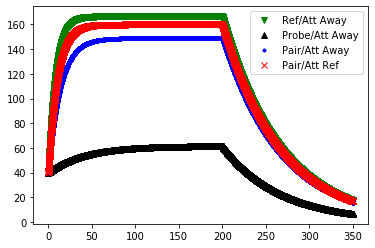

In [139]:
y_v = competition(s = [True, False])
y_h = competition(s = [False, True])
y_vh = competition(s = [True, True])
y_Vh = competition(s = [True, True], att_on_vertical = True)

plot(t, y_v[0:(-1)], "gv", \
     t, y_h[0:(-1)], "k^", \
     t, y_vh[0:(-1)], "b.", \
     t, y_Vh[0:(-1)], "rx")
legend(["Ref/Att Away", "Probe/Att Away", "Pair/Att Away", "Pair/Att Ref"], loc = "upper right")
xlabel("Time from stimulus onset (ms)")
ylabel("Spikes per second")

趨勢上如同 Fig 3a. 的結果，當只有 Ref 刺激時反應是最大，而只有 Probe 刺激時會最小。當兩個刺激同時出現時 (注意力被吸引走)，會比原本在只有 Ref 刺激下，y 神經的最高反應程度被下拉往 Probe 的反應程度靠近。可是當我們要求注意力放在 Ref 刺激上，則 y 神經反應又會往上提升些，但終究沒有單獨只有 Ref 刺激下來的那麼高。

然而這次模擬神經反應與實際觀察值還是有區多差別！像是實際上神經一開始在前 50 ms 沒啥反應，以及在 $50 \sim  100$ ms 之間似乎有過極化的反應，以及到最後沒有刺激出現時它仍保持約 40 spike/second 的基礎率 ......等，這些我們模型上都沒有詳細描述此過程。另一方面，我們模型中的 x1 與 x2 population 也僅僅是對刺激出現的有無直接給與全有和全無的輸入反應，沒有時間上一點的延遲。我們這邊也沒刻劃該 population 對於刺激角度的偏好多做描述，實在有點可惜，不然我們也可以直接產生 Fig 3b. 的結果了。

(現在的模型實在有點粗糙，期中考週沒時間好好探討 QQ，應該是可以有更多精細的設計的。)